
We will be closely following the model suggested by the great papers:<br>
- "High-Resolution Image Synthesis with Latent Diffusion Models"<br> 
    https://arxiv.org/pdf/2006.11239
- "Denoising Diffusion Probabilistic Models"<br> 
    https://arxiv.org/pdf/2112.10752

## High level theory
### Diffusion
diffusion works in the following way: 

1. we input a clean image and add guassian noise in iteration multiple steps(usually 1000) until
 we have a totally noise image(random data).
2. train the unet to predict a noise at a specific timestep 
3. at inference, we start from a noisy, random "image", then we predict the noise from ```T=1000``` 
and subtract it from our last image at timestep ``` t + 1 ``` up until we reach ```t = 0``` which is a clean generated image.

#### Forward proccess
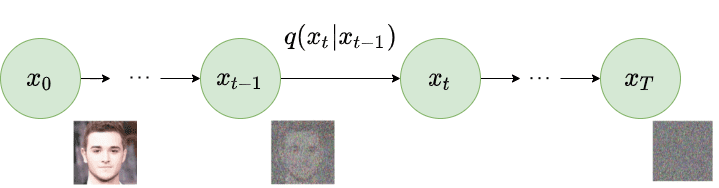

#### Backwards proccess
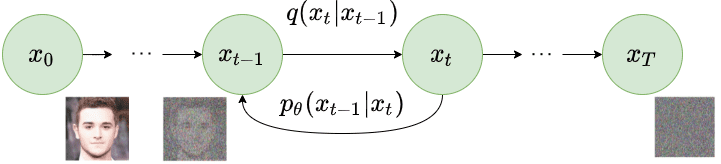

### Latent Diffusion
Latent diffusion is needed because image are very large, so we compress them into a latent representation using a Varitional AutoEncoder(VAE)

### Variational Autoencoder 
#### AutoEncoder
an autoencoder takes an input, and compresses it to smaller dimensions using techniques such as downsampling and CNN.

thats the encoding part of the autoencoder.

the autoencoder can repreduce an image from a latent, smaller dimension by techniques like upsampling and inverse convultion.

#### VAE
Instead of encoding x to a single point z, we encode it into a probability distribution, typically a Gaussian (mean μ, variance σ²).
We then sample from this distribution to get z.
This makes the model stochastic and allows it to generate new data points by sampling from the latent space.
<br>

we will later discuss more detailed theory.

## First implementation

for our first attempt at implementing the model we decided to focus on training the diffusion model and used a pretrained VAE and predefined UNet model. 

later, we will implement the entire proccess.


In [ ]:
!pip install diffusers["torch"] transformers
!pip install torchvision
!pip install torchinfo
!pip install matplotlib

In [1]:
import random
import gc
import torch
import torch.nn.functional as F
from torch import nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, utils
from diffusers import UNet2DModel, AutoencoderKL
from tqdm import tqdm
from torch.amp import GradScaler, autocast
from torchvision.datasets import Places365
from torch.utils.data import Subset


In [2]:
gc.collect()
torch.cuda.empty_cache()
torch.cuda.reset_peak_memory_stats()

In [3]:
print("CUDA available:", torch.cuda.is_available())
print("Device:", torch.device("cuda" if torch.cuda.is_available() else "cpu"))

CUDA available: True
Device: cuda


### Implementing diffusion proccess



#### Importing a pretrained VAE

we use a pretrained VAE in order to try and implement the main mechanism of diffusion models.
later we will create our own VAE.
here, we import from hugging face the AutoencoderKL VAE with input size of ```512``` and latent size of ``` 64 ```

we also freeze the parameters of our vae, so we don't train their weights on the backpropogation.

In [4]:
vae = AutoencoderKL.from_pretrained("CompVis/stable-diffusion-v1-4", subfolder="vae")
vae.to('cuda')

# freeze parameters
for param in vae.parameters():
    param.requires_grad = False

### defined our unet 
we define the UNet in the input size of (4,64,64).
we also define 3 down blocks and 3 upblocks.

In [6]:
unet = UNet2DModel(
    in_channels=4,
    out_channels=4,
    sample_size=64,
    block_out_channels = [64, 128, 256],
    down_block_types=["DownBlock2D", "DownBlock2D", "DownBlock2D"],
    up_block_types=["UpBlock2D", "UpBlock2D", "UpBlock2D"],
)
unet.to('cuda')
unet.enable_gradient_checkpointing()

### Creating our diffusion model

Here, we are caching a few important parameters for calculations in the forward and backward passes.  
Our betas will follow a linear schedule, as proposed by the paper. (We will improve on this later.)  
Alphas and alpha hats are defined as follows:

- $\beta_t$: Noise schedule, linearly spaced between $\beta_{\text{start}}$ and $\beta_{\text{end}}$ for $t = 1, \ldots, T$.
- $\alpha_t = 1 - \beta_t$
- $\hat{\alpha}_t = \prod_{s=1}^t \alpha_s$

where $T$ is the total number of timesteps.



In [7]:
class LatentDiffusion(nn.Module):
    def __init__(self, vae: AutoencoderKL, unet: UNet2DModel,
                 timesteps=1000, beta_start=1e-4, beta_end=0.02, device='cuda', scaling_factor=0.18215):
        super().__init__()
        self.vae = vae
        self.unet = unet
        self.timesteps = timesteps
        self.device = device
        self.scaling_factor = 0.18215
        # linear noise timesteps
        betas = torch.linspace(beta_start, beta_end, timesteps)
        self.register_buffer("betas", betas)
        self.register_buffer("alphas", 1. - betas)
        self.register_buffer("alpha_hat", torch.cumprod(1. - betas, dim=0))
        self.register_buffer("sigmas", torch.sqrt(betas)) #TODO make sure we need this

### Noise sampling

Here, we define the `q_sample` function inside the `LatentDiffusion` class.  
This function generates a noisy latent variable $z_t$ at timestep $t$ from the original latent $z_0$ using the forward diffusion process

The function returns both the noisy latent $z_t$ and the noise $\epsilon$, which will be used as the ground truth for the loss calculation.



In [8]:
def q_sample(self, z0, t):
    noise = torch.randn_like(z0)
    mean = self.alpha_hat[t].sqrt().view(-1,1,1,1) * z0
    deviation = (1 - self.alpha_hat[t]).sqrt().view(-1,1,1,1)
    return mean + deviation*noise, noise

LatentDiffusion.q_sample = q_sample

The loss function first encodes the image into latent space using the VAE encoder and applies the scaling factor.  
It then generates a noisy latent $z_t$ and the corresponding noise at timestep $t$ using the `q_sample` function.  
The UNet predicts the noise from $z_t$ and $t$, and the loss is computed as the mean squared error (MSE) between the predicted noise and the true noise.

In [9]:
def loss(self, imgs, t):
        with torch.no_grad():
            z = self.vae.encode(imgs).latent_dist.sample() * self.scaling_factor
        z_t, noise = self.q_sample(z, t)
        noise_pred = self.unet(z_t, t).sample
        return F.mse_loss(noise_pred, noise)

LatentDiffusion.loss = loss

### Forward pass
We sample a random timestep $t$ for each image in the batch and compute the loss by passing the images and sampled timesteps to our loss function.

In [10]:
def forward(self, imgs):
        batch = imgs.size(0)
        t = torch.randint(0, self.timesteps, (batch,), device=self.device)
        return self.loss(imgs, t)   

LatentDiffusion.forward = forward

### Generation

We predict the noise at each timestep $T...0$ using our now trained unet. We use the denoising equation as suggested in the sampling algorithm. We then run the denoised latent image through the vae decoder, and rescale it back to the original expected size.

In [11]:
@torch.no_grad()
def generate(self, batch_size=1):
    z = torch.randn(batch_size, self.unet.in_channels, self.unet.sample_size, self.unet.sample_size, device=self.device)
    for i in reversed(range(self.timesteps)):
        t = torch.full((batch_size,), i, device=self.device, dtype=torch.long)
        noise_pred = self.unet(z, t).sample
        alpha_t = self.alphas[t].view(-1,1,1,1)
        alpha_hat_t = self.alpha_hat[t].view(-1,1,1,1)
        sigma_t = self.sigmas[t].view(-1,1,1,1)
        z = (z - ((1 - alpha_t) / (1 - alpha_hat_t).sqrt()) * noise_pred)
        z = z / alpha_t.sqrt()
        if i > 0:
            z += sigma_t * torch.randn_like(z)
    imgs = self.vae.decode((z / self.scaling_factor)).sample
    imgs = (imgs.clamp(-1,1) + 1) / 2 # clamp back to [0,1] for pixel values
    return imgs

LatentDiffusion.generate = generate

In [12]:
def train(model, dataloader, epochs=10, lr=1e-4):
    optimizer = torch.optim.Adam(model.unet.parameters(), lr=lr)
    scaler = GradScaler("cuda")
    model.train()
    for epoch in range(epochs):
        total_loss = 0
        loop = tqdm(dataloader, desc=f"Epoch {epoch+1}/{epochs}", leave=True)
        for imgs, _ in loop:
            imgs = imgs.to(model.device)
            optimizer.zero_grad()
            with autocast(device_type='cuda'):
                loss = model(imgs)
            scaler.scale(loss).backward()
            scaler.step(optimizer)
            scaler.update()
            total_loss += loss.item()
            loop.set_postfix(loss=loss.item())
        print(f"Epoch {epoch+1} | Avg Loss: {total_loss/len(dataloader):.4f}")

### Preproccessing data

here, we pickout from the place365 dataset, 10 classes which are likely close in latent space.
the reason we do this is since the dataset is very large and want to reduce our training time.
we used the places 365, since its image size are big and easy to use with our implementation.

In [13]:
# 10 classes that are likely close in latent space, so we pick them as we are limited with our conpute power
target_class_names = [
    '/b/bedroom',
    '/l/living_room',
    '/d/dining_room',
    '/k/kitchen',
    '/h/home_office',
    '/n/nursery',
    '/b/bathroom',
    '/h/hotel_room',
    '/w/waiting_room',
    '/c/conference_room'
]

#### Transformation 
it is important to normalize the data between -1 to 1 since this is what our VAE expects to recieve.
we also augment the data in order to make the model more general.

In [ ]:

transform = transforms.Compose([
    transforms.Resize((512, 512)),
    transforms.ToTensor(),  # Converts to [0,1]
    transforms.Normalize(mean=[0.5, 0.5, 0.5], std=[0.5, 0.5, 0.5])  # Normalize to [-1,1]
])
dataset = Places365(
    root='~/datasets/places365',
    split='train-standard',  # or 'val'
    transform=transform,
    download=True
)
class_to_idx = {name: i for i, name in enumerate(dataset.classes)}
target_class_indices = {class_to_idx[name] for name in target_class_names}

# Filter matching samples
subset_indices = [
    i for i, (_, label) in enumerate(dataset.imgs)
    if label in target_class_indices
]
subset = Subset(dataset, subset_indices)
print(f"Loaded {len(subset)} samples from 10 similar classes.")



Loaded 50000 samples from 10 similar classes.


#### Loading the data

we load the data in batchs of 128, we had the oppritunity to use a high end graphics card(nvidia A100), so we used a big batch size that filled up the graphics card memory.
this allowed us to use a fairly high resultion dataset.

In [34]:
loader = DataLoader(subset, batch_size=128, shuffle=True, num_workers=4,pin_memory=True, persistent_workers=True)


#### Strating the training

In [ ]:

diffusion = LatentDiffusion(vae, unet, timesteps=1000)
diffusion.to('cuda')
train(diffusion, loader, epochs=10, lr=9e-5)
torch.save(diffusion.state_dict(), "diffusion_model.pt")

#### Generating the samples

TODO training graphs!!!!

In [ ]:
samples = diffusion.generate(batch_size=4)
grid = utils.make_grid(samples, nrow=2)
utils.save_image(grid, 'generated_imgs_v1.2_20_epoch.png')

#### Our generations

From best to worst:

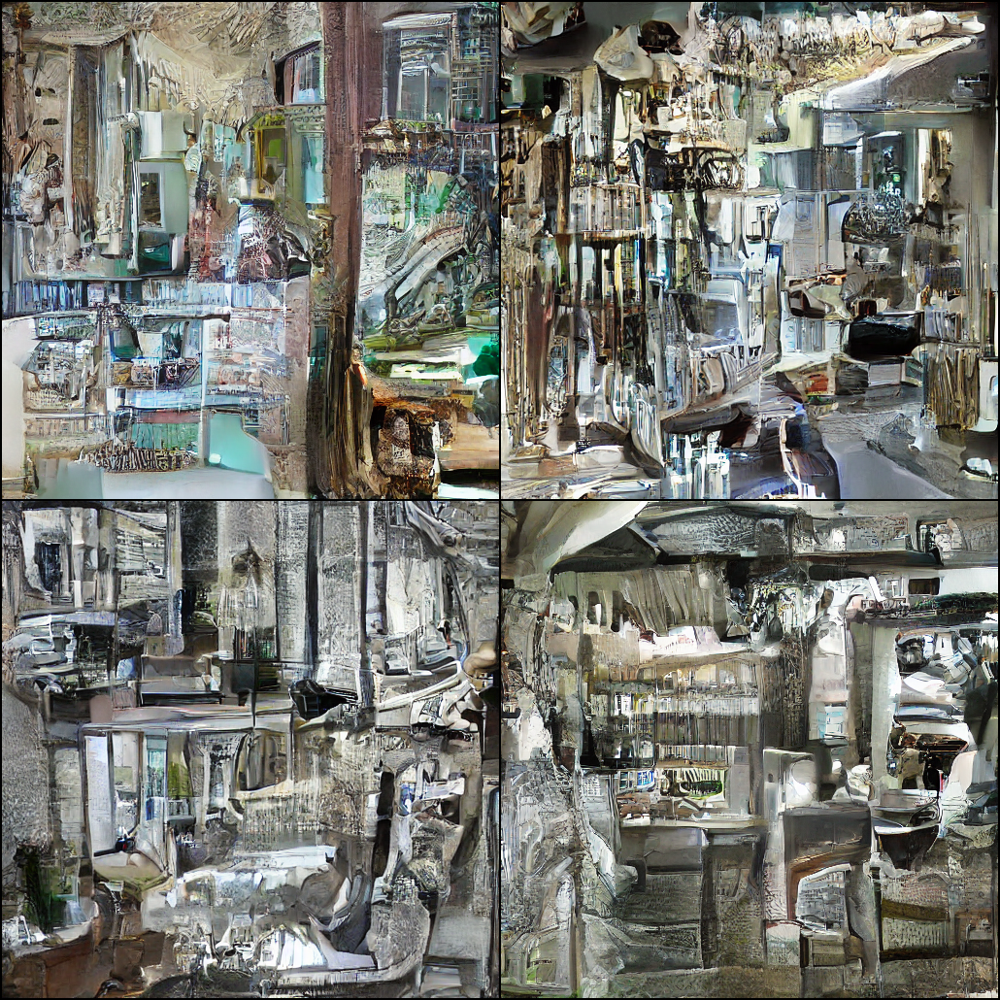
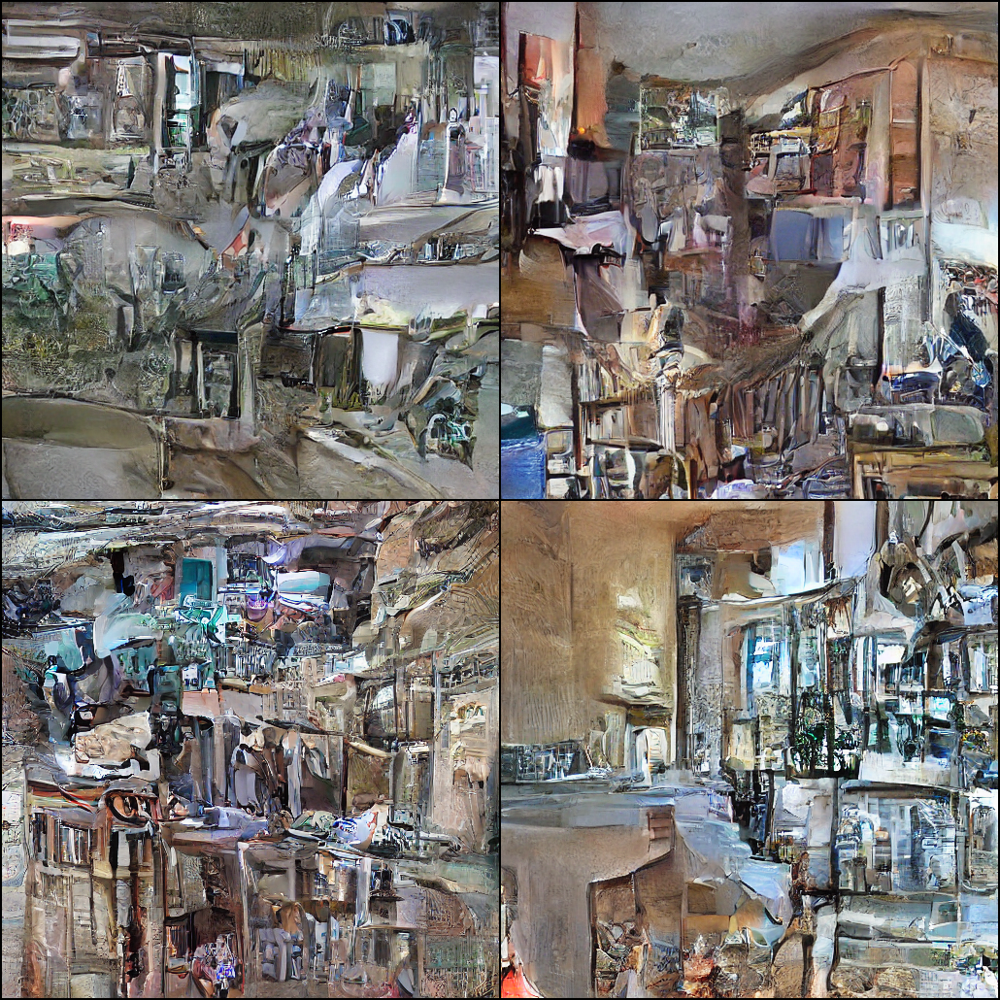
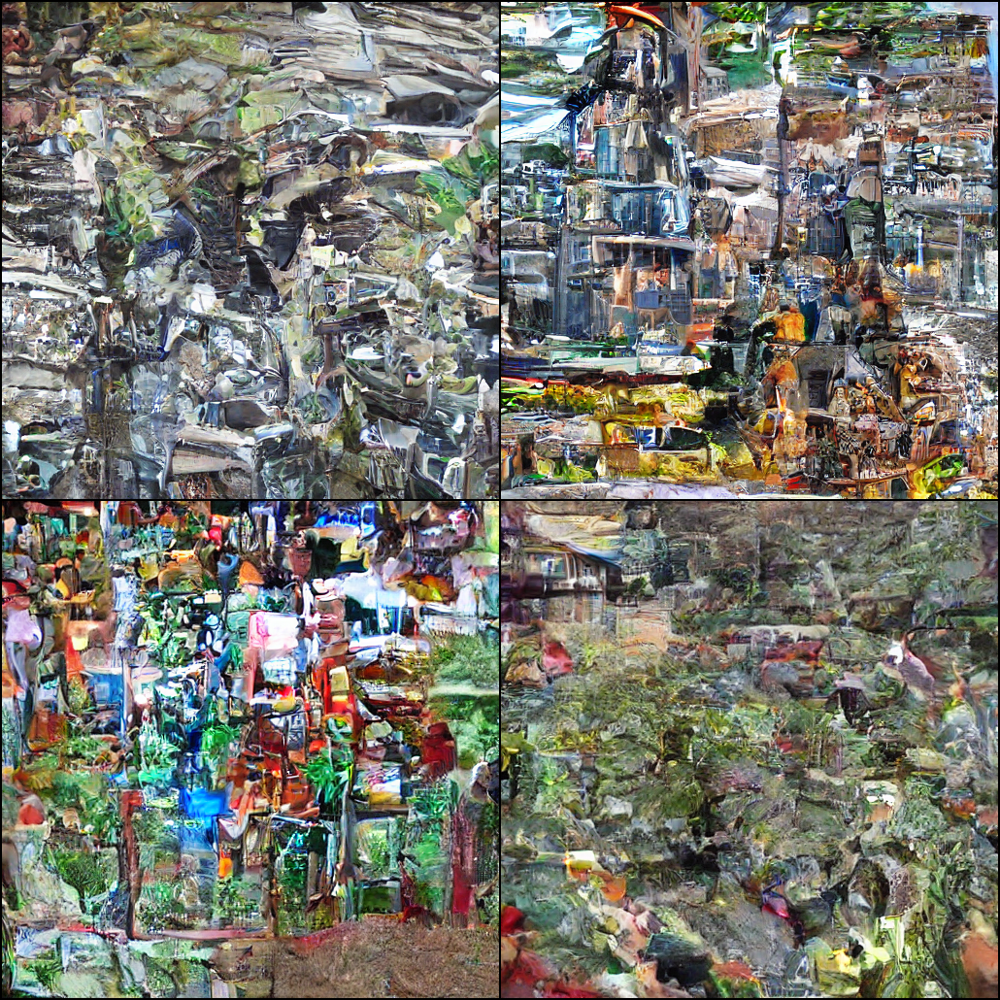
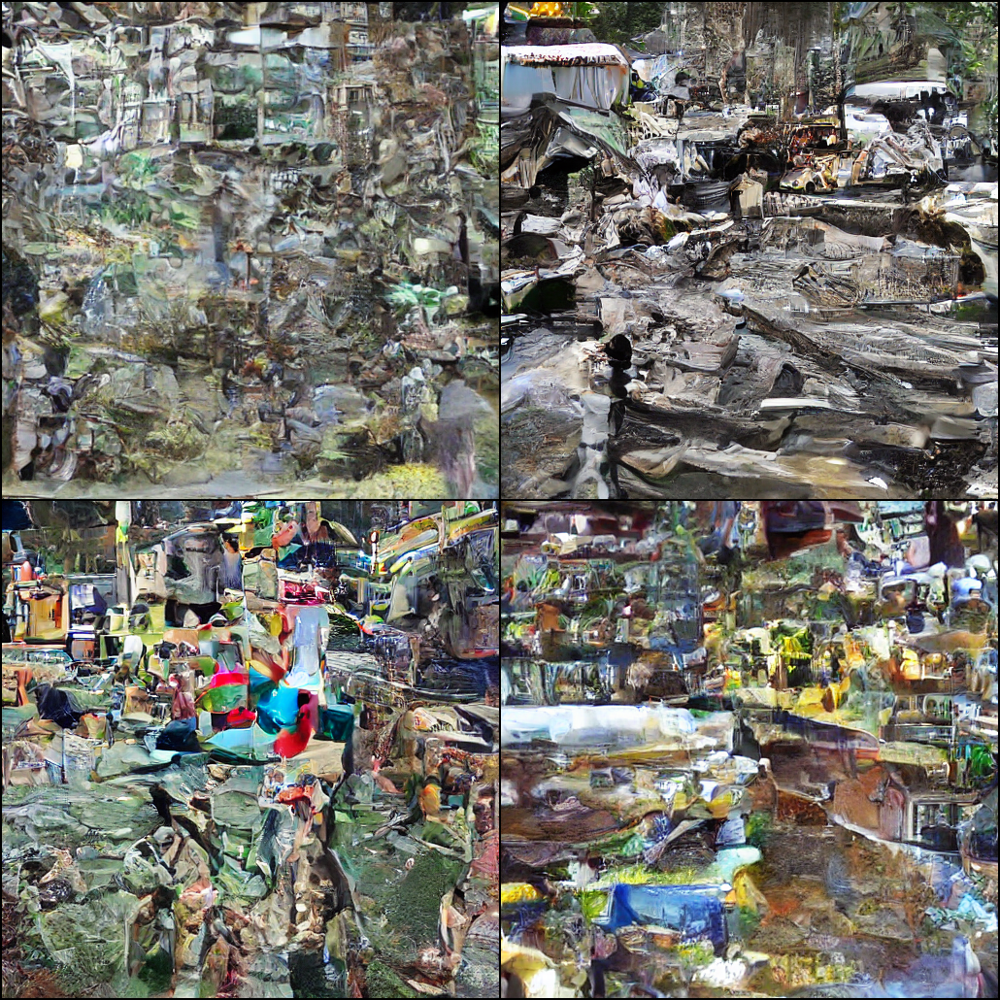




### Conclusions for this part

as we can see there is some structre that is captured by our diffusion model, but far from usable.
training platued and additional training wouldn't help.
we had to change our architecture and approach, but in general the diffusion proccess was successful.


## VAE + Adversarial Implementation

Since using a pre-trained VAE requires 512x512 images,training time is too long on our machines, we used some cloud machines but still takes a lot of time.
to combat that, we are implementing and training our own tiny VAE.
we will be following an adversarial approach as proposed in the implementation details by the paper:

https://arxiv.org/pdf/2112.10752

In [2]:
import matplotlib.pyplot as plt
from tqdm import tqdm
import torch
import torch.nn.functional as F
from torch import nn
from torch.utils.data import DataLoader
from torchvision import datasets, transforms, utils
from torch.utils.data import Subset
import gc



### Defining our VAE with an adverserial approach

this time, we opted to use CIFAR-100 as our dataset to be able to train locally as the images are of size ``` 32x32 ```.
we define the input size of the VAE as ``` 32x32 ```, and added encoder,decoder and latent space(z) layers.

the latent space size is 64.

#### Reparameterization trick
in order to make the computation graph not random and diffrentiable.

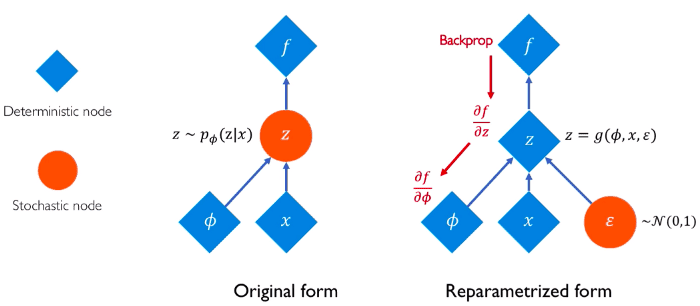

"Because we cannot compute the gradient of an expectation, we “move” the parameters of the probability distribution from the distribution space to the expectation space. In other words, we want to rewrite the expectation so that the distribution is independent of the parameter 
θ
θ. Then we simply take the gradient as we did for the model parameters." - https://theaisummer.com/latent-variable-models/#reparameterization-trick

#### Encoder

we use 3 convolution blocks to encoder in order to compress the input into latent rep. by logvar and variance. the filter size grows up to ``` 128 ``` filters.

#### Decoder

we use 3 transposed convolution blocks to decompress the rep.

In [3]:
class TinyVAEAdversarial(nn.Module):
    def __init__(self, in_channels=3, latent_dim=64):
        super().__init__()
        self.latent_dim = latent_dim
        #Output Size = (Input Size - Kernel Size + 2 * Padding) / Stride + 1.
        self.encoder = nn.Sequential(
            nn.Conv2d(in_channels, 32, 4, 2, 1), # 32x32 -> 16x16
            nn.ReLU(),
            nn.Conv2d(32, 64, 4, 2, 1), # 16x16 -> 8x8
            nn.ReLU(),
            nn.Conv2d(64, 128, 4, 2, 1), # 8x8 -> 4x4
            nn.ReLU()
        )

        self.flatten = nn.Flatten()
        self.mean = nn.Linear(128*4*4,latent_dim)
        self.logvar = nn.Linear(128*4*4,latent_dim)

        self.z = nn.Linear(latent_dim, 128 * 4 * 4)


        self.decoder = nn.Sequential(
            nn.ConvTranspose2d(128, 64, 4, 2, 1), 
            nn.ReLU(),
            nn.ConvTranspose2d(64, 32, 4, 2, 1),
            nn.ReLU(),
            nn.ConvTranspose2d(32, in_channels, 4, 2, 1),
            nn.Sigmoid() # value between 0-1
        )
    def reparameterize(self, mu, logvar):
        std = torch.exp(0.5 * logvar)
        eps = torch.randn_like(std)
        return mu + eps * std

    def encode(self,x):
        latent = self.encoder(x)
        latent_flat = self.flatten(latent)
        logvar = self.logvar(latent_flat)
        mean = self.logvar(latent_flat)
        return mean,logvar

    def decode(self,latent):
        flattened = self.z(latent).view(-1, 128, 4, 4)
        img = self.decoder(flattened)
        return img

    def forward(self,x):
        mean,logvar = self.encode(x)
        z = self.reparameterize(mean,logvar)
        x_hat = self.decode(z)

        return x_hat,mean,logvar

        


### Building the discriminator
we use convolution layers to learn different parts of the image to detect if the image is fake or not, and output it to a sigmoid activation function.


In [4]:
class Discriminator(nn.Module):
    def __init__(self, in_channels=3,negative_slope_lrlu=0.2):
        super().__init__()
        self.model = nn.Sequential(
            nn.Conv2d(in_channels, 32, 4, 2, 1),
            nn.LeakyReLU(negative_slope_lrlu),
            nn.Conv2d(32, 64, 4, 2, 1),
            nn.BatchNorm2d(64),
            nn.LeakyReLU(negative_slope_lrlu),
            nn.Conv2d(64, 128, 4, 2, 1),
            nn.BatchNorm2d(128),
            nn.LeakyReLU(negative_slope_lrlu),
            nn.Flatten(),
            nn.Linear(128 * 4 * 4, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.model(x)


### Building the loss function

we follow the implementation as proposed by the above papers.
we first compute the reconstruction loss, compute the adversarial loss.
the adversarial loss wants to maximize the function while the autoencoder wants to minimize the maximazation of the adversarial.

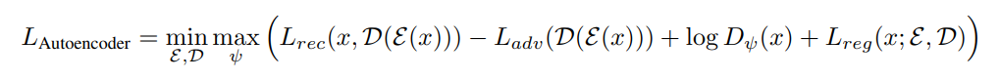

In [5]:
def full_autoencoder_loss(x, x_hat, mu, logvar, d_fake, d_real, kl_weight=1e-6):
    # reconstruction loss
    l_rec = F.mse_loss(x_hat, x, reduction='mean')

    # try to fool discriminator (make it think fake is real)
    l_adv = F.binary_cross_entropy(d_fake, torch.ones_like(d_fake))

    # reward Dψ(x)
    log_d_real = torch.log(d_real + 1e-8).mean() 

    # KL divergence
    l_kl = -0.5 * torch.sum(1 + logvar - mu.pow(2) - logvar.exp()) / x.size(0)

    return l_rec - l_adv + log_d_real + kl_weight * l_kl


In [6]:
def train_epoch(model, discriminator, dataloader, opt_ae, opt_d, device, kl_weight=1e-6):
    model.train()
    discriminator.train()

    total_ae_loss, total_d_loss = 0, 0


    loop = tqdm(dataloader,desc='Training...', leave=True)

    for x, _ in loop:
        x = x.to(device)

        # Forward pass
        x_hat, mu, logvar = model(x)

        # Discriminator forward
        d_real = discriminator(x)
        d_fake = discriminator(x_hat.detach())

        # Update Discriminator (maximize log Dψ(x) + log(1 − Dψ(x̂)) ) 
        loss_d_real = F.binary_cross_entropy(d_real, torch.ones_like(d_real))
        loss_d_fake = F.binary_cross_entropy(d_fake, torch.zeros_like(d_fake))
        loss_d = loss_d_real + loss_d_fake

        opt_d.zero_grad()
        loss_d.backward()
        opt_d.step()

        # Update Autoencoder (min full loss) 
        d_real = discriminator(x)
        d_fake = discriminator(x_hat)

        loss_ae = full_autoencoder_loss(x, x_hat, mu, logvar, d_fake, d_real, kl_weight)

        opt_ae.zero_grad()
        loss_ae.backward()
        opt_ae.step()

        total_ae_loss += loss_ae.item()
        total_d_loss += loss_d.item()

        loop.set_postfix({
            'AE Loss': f"{loss_ae.item():.4f}",
            'D Loss': f"{loss_d.item():.4f}"
        })

    return total_ae_loss / len(dataloader), total_d_loss / len(dataloader)


### Preprocessing the data
we normalize the data into the expected format, from -1 to 1. 
we also augment the data, using horizontal flip and rotation.
this is used to generalize the model.

In [7]:
from torchvision import transforms

transform = transforms.Compose([
    transforms.RandomHorizontalFlip(p=0.5),         # 50% chance to flip left-right
    transforms.RandomRotation(degrees=15),          # Rotate ±15 degrees
    transforms.ToTensor(),                          # Convert to tensor
    transforms.Normalize((0.5, 0.5, 0.5),            # Normalize RGB channels to [-1, 1]
                         (0.5, 0.5, 0.5))
])

### Loading the data

In [8]:
from torchvision.datasets import CIFAR100
from torch.utils.data import DataLoader

train_dataset = CIFAR100(
    root='./data',
    train=True,
    download=True,
    transform=transform
)

dataloader = DataLoader(
    train_dataset,
    batch_size=128,
    shuffle=True,
    num_workers=4,
    pin_memory=True
)

In [9]:
def plot_loss(train_losses, title:str, label:str):
    epochs = list(range(1, len(train_losses) + 1))
    plt.figure(figsize=(10, 6))
    plt.plot(epochs, train_losses, marker='o', label=label)
    plt.title(title)
    plt.xlabel('Epoch')
    plt.ylabel('Average Loss')
    plt.grid(True)
    plt.legend()
    plt.tight_layout()
    plt.show()

### Defining and training the model

In [12]:
device = "cuda"
model = TinyVAEAdversarial()
model.to(device=device)
discriminator = Discriminator().to(device)

opt_ae = torch.optim.Adam(model.parameters(), lr=1e-3)
opt_d = torch.optim.Adam(discriminator.parameters(), lr=1e-4)

epochs = 10
ae_losses = []
d_losses = []
for epoch in range(1, epochs):
    print(f"[in epoch {epoch}/{epochs}]")
    ae_loss, d_loss = train_epoch(model, discriminator, dataloader, opt_ae, opt_d, device)
    ae_losses.append(ae_loss)
    d_losses.append(d_loss)
    print(f"[{epoch:02d}] AE Loss: {ae_loss:.4f} | D Loss: {d_loss:.4f}")

[in epoch 1/10]


Training...: 100%|██████████| 391/391 [00:13<00:00, 27.95it/s, AE Loss=-13.6085, D Loss=0.0008] 


[01] AE Loss: -12.7005 | D Loss: 0.0251
[in epoch 2/10]


Training...: 100%|██████████| 391/391 [00:13<00:00, 28.42it/s, AE Loss=-13.9462, D Loss=0.0002] 


[02] AE Loss: -13.8183 | D Loss: 0.0004
[in epoch 3/10]


Training...: 100%|██████████| 391/391 [00:13<00:00, 28.40it/s, AE Loss=-13.9375, D Loss=0.0001] 


[03] AE Loss: -14.0364 | D Loss: 0.0002
[in epoch 4/10]


Training...: 100%|██████████| 391/391 [00:13<00:00, 28.43it/s, AE Loss=-14.0306, D Loss=0.0001] 


[04] AE Loss: -14.1677 | D Loss: 0.0001
[in epoch 5/10]


Training...: 100%|██████████| 391/391 [00:13<00:00, 28.34it/s, AE Loss=-14.2580, D Loss=0.0000] 


[05] AE Loss: -14.2595 | D Loss: 0.0001
[in epoch 6/10]


Training...: 100%|██████████| 391/391 [00:13<00:00, 28.57it/s, AE Loss=-14.3519, D Loss=0.0000] 


[06] AE Loss: -14.3351 | D Loss: 0.0000
[in epoch 7/10]


Training...: 100%|██████████| 391/391 [00:13<00:00, 28.29it/s, AE Loss=-14.4731, D Loss=0.0000] 


[07] AE Loss: -14.4176 | D Loss: 0.0000
[in epoch 8/10]


Training...: 100%|██████████| 391/391 [00:13<00:00, 28.49it/s, AE Loss=-14.5870, D Loss=0.0000] 


[08] AE Loss: -14.4982 | D Loss: 0.0000
[in epoch 9/10]


Training...: 100%|██████████| 391/391 [00:13<00:00, 28.31it/s, AE Loss=-14.6759, D Loss=0.0000] 

[09] AE Loss: -14.5879 | D Loss: 0.0000


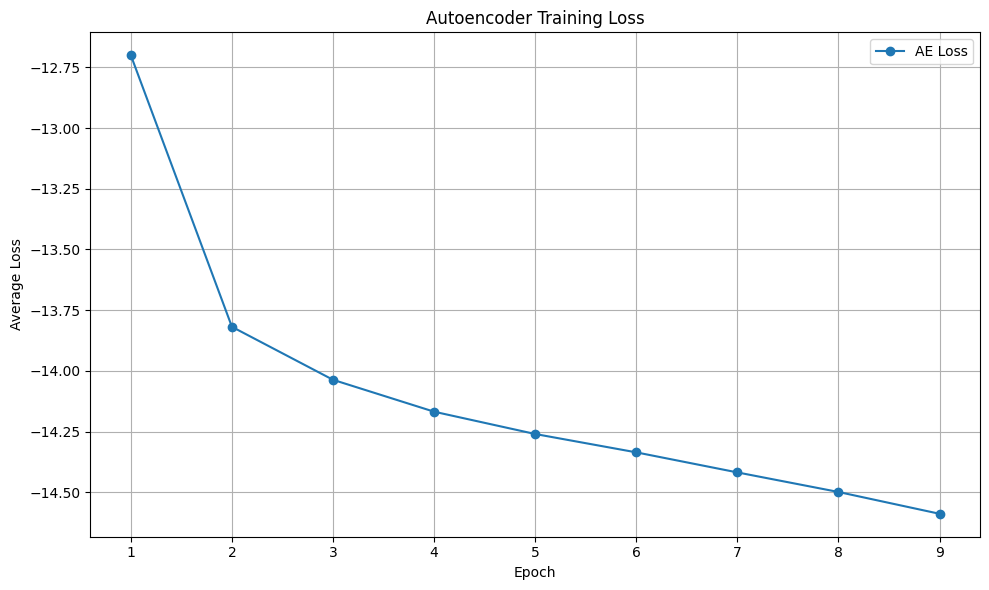

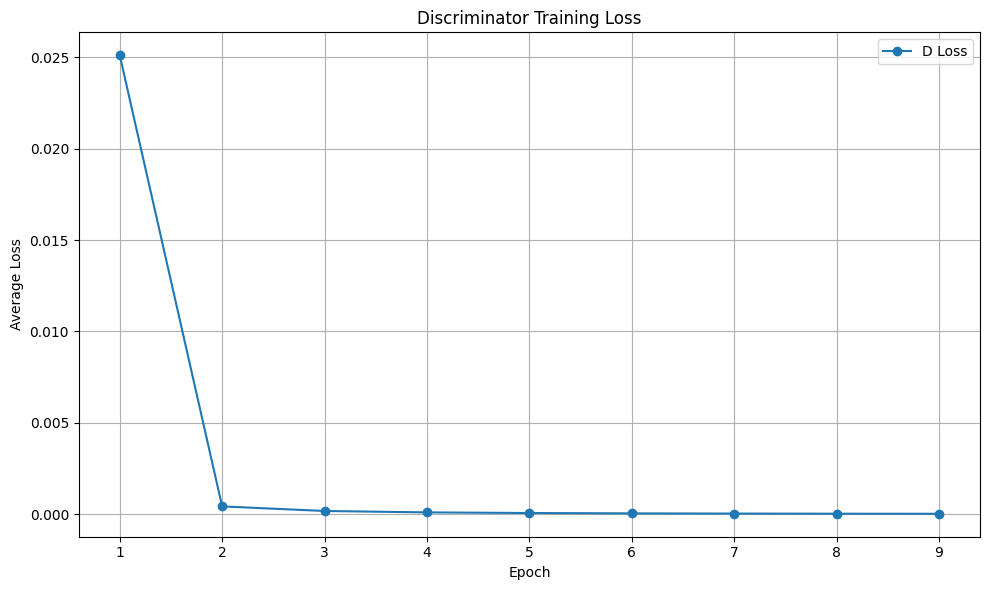

In [13]:
plot_loss(ae_losses, title='Autoencoder Training Loss', label='AE Loss')
plot_loss(d_losses, title='Discriminator Training Loss', label='D Loss')

In [14]:
def show_reconstruction(model, dataset, device):
    model.eval()  # encoder & decoder both fine in eval when using GroupNorm

    # inverse of Normalize((0.5,0.5,0.5), (0.5,0.5,0.5))
    denorm = lambda t: t * 0.5 + 0.5   # [-1,1] → [0,1]

    # pick a random CIFAR‑sample
    idx = torch.randint(0, len(dataset), ()).item()
    x, _ = dataset[idx]          # tensor in [-1,1]
    x = x.unsqueeze(0).to(device)

    with torch.no_grad():
        x_hat, _, _ = model(x)   # forward pass

    # prepare for display
    x_vis     = denorm(x.squeeze().cpu())       # (C,H,W) → [0,1]
    x_hat_vis = denorm(x_hat.squeeze().cpu())

    # plot
    fig, ax = plt.subplots(1, 2, figsize=(6, 3))
    ax[0].imshow(x_vis.permute(1, 2, 0));     ax[0].set_title('Original');       ax[0].axis('off')
    ax[1].imshow(x_hat_vis.permute(1, 2, 0)); ax[1].set_title('Reconstruction'); ax[1].axis('off')
    plt.tight_layout();  plt.show()

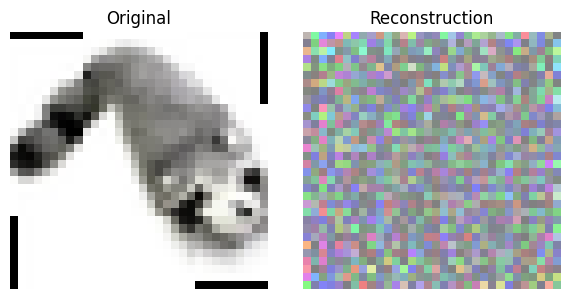

In [18]:
show_reconstruction(model, train_dataset, device)

### Adverserial Conclusion
We have reached mode collapse on our VAE thanks to our Discriminator learning way too quickly, and throwing off the VAE's loss function.
We have actually tried many different hyperparameters and even architecture changes for both the VAE and Discriminator, to no avail.
For brevity, we have not included these experimentations, since they all reached about the same results.
The adverserial approach is apparently known as finicky and hard to train, so we will drop this idea going forward.